<a href="https://colab.research.google.com/github/Eliasmarcet91/CV/blob/main/Copy_of_CNN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Download your kaggle.json file from kaggle.com (go to your profile - settings...)
from google.colab import files
uploaded = files.upload()

Saving kaggle.json to kaggle (1).json


In [ ]:
!mkdir ~/.kaggle

!cp kaggle.json ~/.kaggle/

mkdir: cannot create directory ‘/root/.kaggle’: File exists


In [ ]:
!kaggle datasets download -d pybear/cats-vs-dogs

Dataset URL: https://www.kaggle.com/datasets/pybear/cats-vs-dogs
License(s): CC0-1.0
cats-vs-dogs.zip: Skipping, found more recently modified local copy (use --force to force download)


In [ ]:
!unzip cats-vs-dogs.zip

Archive:  cats-vs-dogs.zip
replace MSR-LA - 3467.docx? [y]es, [n]o, [A]ll, [N]one, [r]ename: 

In [ ]:
# Identify any bad images
import os
from PIL import Image

def validate_images(directory):
    corrupted_files = []

    # Walk through directory and sub-directories
    for dirpath, _, filenames in os.walk(directory):
        print(f"Scanning directory: {dirpath}")

        for image_file in filenames:
            # Check for common image extensions
            if image_file.lower().endswith(('.png', '.jpg', '.jpeg', '.tiff', '.bmp', '.gif')):
                image_path = os.path.join(dirpath, image_file)
                try:
                    with Image.open(image_path) as img:
                        img.verify()
                except Exception as e:
                    corrupted_files.append(image_path)
                    print(f"Error with {image_path}: {e}")

    return corrupted_files

# Example usage:
directory = "PetImages"  # Make sure to change to YOUR directory!
corrupted_images = validate_images(directory)
if corrupted_images:
    print(f"Found {len(corrupted_images)} corrupted images.")
else:
    print("All images are valid!")

Scanning directory: PetImages
Scanning directory: PetImages/Cat
Error with PetImages/Cat/666.jpg: cannot identify image file 'PetImages/Cat/666.jpg'
Scanning directory: PetImages/Dog
Error with PetImages/Dog/11702.jpg: cannot identify image file 'PetImages/Dog/11702.jpg'


/usr/local/lib/python3.10/dist-packages/PIL/TiffImagePlugin.py:858: UserWarning: Truncated File Read
  warnings.warn(str(msg))


Found 2 corrupted images.


In [ ]:
import os
from PIL import Image

def validate_images(directory, delete_corrupted=False):
    corrupted_files = []

    # Walk through directory and sub-directories
    for dirpath, _, filenames in os.walk(directory):
        print(f"Scanning directory: {dirpath}")

        for image_file in filenames:
            # Check for common image extensions
            if image_file.lower().endswith(('.png', '.jpg', '.jpeg', '.tiff', '.bmp', '.gif')):
                image_path = os.path.join(dirpath, image_file)
                try:
                    with Image.open(image_path) as img:
                        img.verify()
                except Exception as e:
                    corrupted_files.append(image_path)
                    print(f"Error with {image_path}: {e}")
                    if delete_corrupted:
                        try:
                            os.remove(image_path)
                            print(f"Deleted corrupted file: {image_path}")
                        except Exception as del_error:
                            print(f"Error deleting {image_path}: {del_error}")

    return corrupted_files

# Example usage:
directory = "PetImages"  # Make sure to change to YOUR directory!

# First scan and delete corrupted images
corrupted_images = validate_images(directory, delete_corrupted=True)
if corrupted_images:
    print(f"\nFound and deleted {len(corrupted_images)} corrupted images.")
    print("List of corrupted images (deleted):")
    for img in corrupted_images:
        print(img)
else:
    print("All images are valid!")

# Second scan to confirm
print("\nRunning a second scan to confirm...")
corrupted_images_second_scan = validate_images(directory)
if corrupted_images_second_scan:
    print(f"\nStill found {len(corrupted_images_second_scan)} corrupted images.")
    print("List of corrupted images (still present):")
    for img in corrupted_images_second_scan:
        print(img)
else:
    print("All images are valid!")

Scanning directory: PetImages
Scanning directory: PetImages/Cat
Scanning directory: PetImages/Dog
All images are valid!

Running a second scan to confirm...
Scanning directory: PetImages
Scanning directory: PetImages/Cat
Scanning directory: PetImages/Dog
All images are valid!


In [ ]:
!ls PetImages/Cat | wc -l #word count to see how many files there are
!ls PetImages/Dog | wc -l

12500
12500


In [ ]:
import os
import random
import pathlib
import shutil
import matplotlib.pyplot as plt

In [ ]:
# Distinct image classes
img_classes = ['cat', 'dog']

# Folders for training, testing, and validation subsets
dir_data  = pathlib.Path.cwd().joinpath('data')
dir_train = dir_data.joinpath('train')
dir_valid = dir_data.joinpath('validation')
dir_test  = dir_data.joinpath('test')

# Train/Test/Validation split config
pct_train = 0.8
pct_valid = 0.1
pct_test = 0.1

In [ ]:
def setup_folder_structure() -> None:
    # Create base folders if they don't exist
    if not dir_data.exists():  dir_data.mkdir()
    if not dir_train.exists(): dir_train.mkdir()
    if not dir_valid.exists(): dir_valid.mkdir()
    if not dir_test.exists():  dir_test.mkdir()

    # Create subfolders for each class
    for cls in img_classes:
        if not dir_train.joinpath(cls).exists(): dir_train.joinpath(cls).mkdir()
        if not dir_valid.joinpath(cls).exists(): dir_valid.joinpath(cls).mkdir()
        if not dir_test.joinpath(cls).exists():  dir_test.joinpath(cls).mkdir()

    # Print the directory structure
    # Credits - https://stackoverflow.com/questions/3455625/linux-command-to-print-directory-structure-in-the-form-of-a-tree
    dir_str = os.system('''ls -R data | grep ":$" | sed -e 's/:$//' -e 's/[^-][^\/]*\//--/g' -e 's/^/   /' -e 's/-/|/' ''')
    print(dir_str)
    return


setup_folder_structure()

0


In [ ]:
# take the data from PetImages (or whatever you have)... and load it into the new directories
def train_test_validation_split(src_folder: pathlib.PosixPath, class_name: str) -> dict:
    # For tracking
    n_train, n_valid, n_test = 0, 0, 0

    # Random seed for reproducibility
    random.seed(42)

    # Iterate over every image
    for file in src_folder.iterdir():
        img_name = str(file).split('/')[-1]

        # Make sure it's JPG
        if file.suffix == '.jpg':
            # Generate a random number
            x = random.random()

            # Where should the image go?
            tgt_dir = ''

            # .80 or below
            if x <= pct_train:
                tgt_dir = 'train'
                n_train += 1

            # Between .80 and .90
            elif pct_train < x <= (pct_train + pct_valid):
                tgt_dir = 'validation'
                n_valid += 1

            # Above .90
            else:
                tgt_dir = 'test'
                n_test += 1

            # Copy the image
            shutil.copy(
                src=file,
                # data/<train|valid|test>/<cat\dog>/<something>.jpg
                dst=f'{str(dir_data)}/{tgt_dir}/{class_name}/{img_name}'
            )

    return {
        'source': str(src_folder),
        'target': str(dir_data),
        'n_train': n_train,
        'n_validaiton': n_valid,
        'n_test': n_test
    }

In [ ]:
#%%time

train_test_validation_split(
    src_folder=pathlib.Path.cwd().joinpath('PetImages/Cat'),
    class_name='cat'
)

#%%time

train_test_validation_split(
    src_folder=pathlib.Path.cwd().joinpath('PetImages/Dog'),
    class_name='dog'
)

{'source': '/content/PetImages/Dog',
 'target': '/content/data',
 'n_train': 10015,
 'n_validaiton': 1239,
 'n_test': 1245}

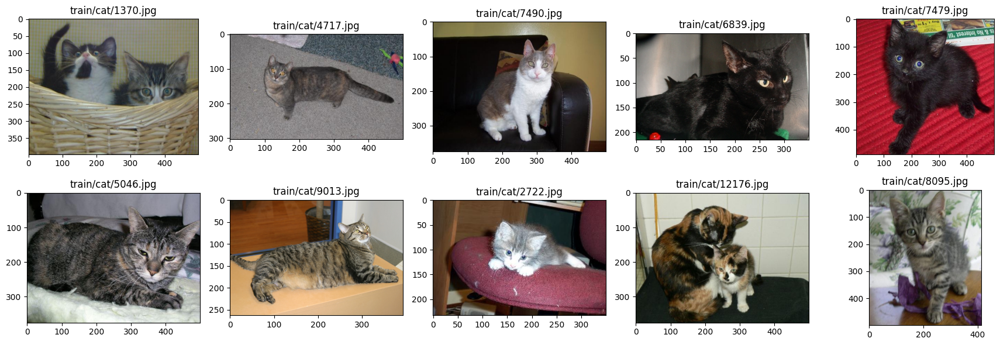

In [ ]:
def plot_random_sample(img_dir: pathlib.PosixPath):
    # How many images we're showing
    n = 10
    # Get absolute paths to these N images
    imgs = random.sample(list(img_dir.iterdir()), n)

    # Make sure num_row * num_col = n
    num_row = 2
    num_col = 5

    # Create a figure
    fig, axes = plt.subplots(num_row, num_col, figsize=(3.5 * num_col, 3 * num_row))
    # For every image
    for i in range(num_row * num_col):
        # Read the image
        img = plt.imread(str(imgs[i]))
        # Display the image
        ax = axes[i // num_col, i % num_col]
        ax.imshow(img)
        # Set title as <train|test|validation>/<cat\dog>/<img_name>.jpg
        ax.set_title('/'.join(str(imgs[i]).split('/')[-3:]))

    plt.tight_layout()
    plt.show()


plot_random_sample(img_dir=pathlib.Path().cwd().joinpath('data/train/cat'))

In [ ]:
import os
import pathlib
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'

import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
tf.random.set_seed(42)

from PIL import Image, ImageOps
from IPython.display import display
import warnings
warnings.filterwarnings('ignore')

(346, 461, 3)


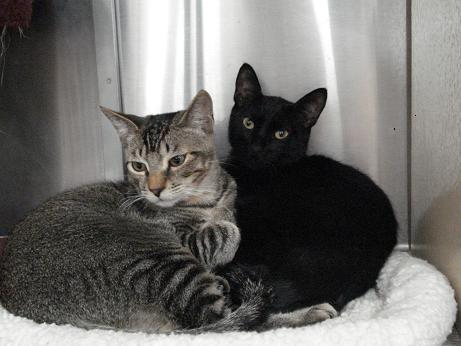

In [ ]:
img1 = Image.open('data/train/cat/8.jpg')
print(np.array(img1).shape)
display(img1)

In [35]:
from PIL import Image, ImageOps
import matplotlib.pyplot as plt

def plot_image(img: np.array):
    plt.figure(figsize=(6, 6))
    plt.imshow(img, cmap='gray');

def plot_two_images(img1: np.array, img2: np.array):
    _, ax = plt.subplots(1, 2, figsize=(12, 6))
    ax[0].imshow(img1, cmap='gray')
    ax[1].imshow(img2, cmap='gray');

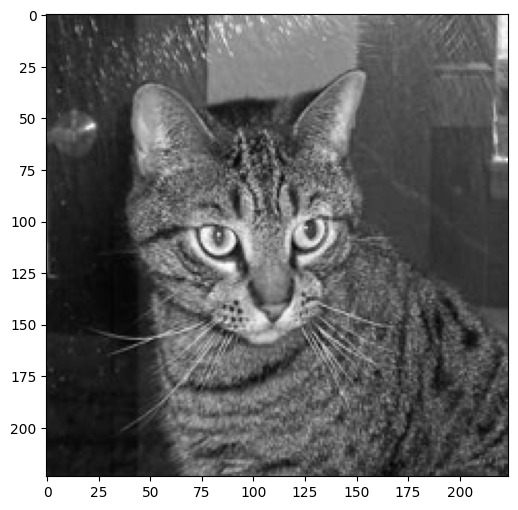

In [36]:
img = Image.open('data/train/cat/1.jpg')
img = ImageOps.grayscale(img)
img = img.resize(size=(224, 224))
plot_image(img=img)

In [37]:
def get_pools(img: np.array, pool_size: int, stride: int) -> np.array:
    # To store individual pools
    pools = []

    # Iterate over all row blocks (single block has `stride` rows)
    for i in np.arange(img.shape[0], step=stride):
        # Iterate over all column blocks (single block has `stride` columns)
        for j in np.arange(img.shape[0], step=stride):

            # Extract the current pool
            mat = img[i:i+pool_size, j:j+pool_size]

            # Make sure it's rectangular - has the shape identical to the pool size
            if mat.shape == (pool_size, pool_size):
                # Append to the list of pools
                pools.append(mat)

    # Return all pools as a Numpy array
    return np.array(pools)
cat_img_pools = get_pools(img=np.array(img), pool_size=2, stride=2)
cat_img_pools

array([[[39, 41],
        [42, 43]],

       [[41, 41],
        [44, 44]],

       [[41, 42],
        [43, 45]],

       ...,

       [[77, 48],
        [77, 52]],

       [[25, 32],
        [36, 44]],

       [[29, 49],
        [38, 32]]], dtype=uint8)

In [38]:
def max_pooling(pools: np.array) -> np.array:
    # Total number of pools
    num_pools = pools.shape[0]
    # Shape of the matrix after pooling - Square root of the number of pools
    # Cast it to int, as Numpy will return it as float
    # For example -> np.sqrt(16) = 4.0 -> int(4.0) = 4
    tgt_shape = (int(np.sqrt(num_pools)), int(np.sqrt(num_pools)))
    # To store the max values
    pooled = []

    # Iterate over all pools
    for pool in pools:
        # Append the max value only
        pooled.append(np.max(pool))

    # Reshape to target shape
    return np.array(pooled).reshape(tgt_shape)

array([[ 43,  44,  45, ..., 163, 201, 197],
       [ 45,  44,  45, ..., 165, 197, 198],
       [ 43,  37,  38, ..., 165, 185, 200],
       ...,
       [ 24,  19,  19, ...,  76,  78,  43],
       [ 30,  21,  23, ...,  58,  51,  42],
       [ 32,  23,  25, ...,  77,  44,  49]], dtype=uint8)
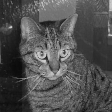

In [39]:
cat_max_pooled = max_pooling(pools=cat_img_pools)
cat_max_pooled

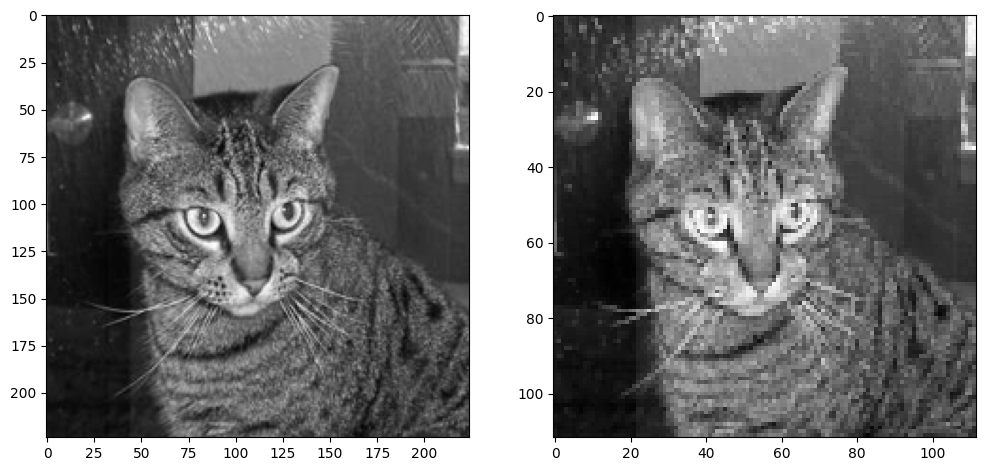

In [40]:
plot_two_images(img1=img, img2=cat_max_pooled)


In [41]:
#Building a CNN

import os
import pathlib
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'

import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
tf.random.set_seed(42)

from PIL import Image, ImageOps
from IPython.display import display
import warnings
warnings.filterwarnings('ignore')

(281, 300, 3)


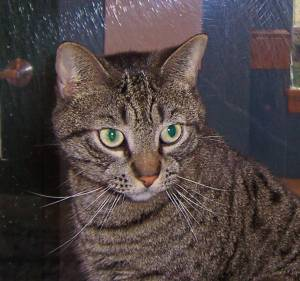

In [42]:
img1 = Image.open('data/train/cat/1.jpg') #verify size of image, the CNN requires all iamges to be the same size
print(np.array(img1).shape)
display(img1)

array([[[ 36,  41,  37],
        [ 37,  42,  38],
        [ 38,  42,  41],
        ...,
        [200, 198, 160],
        [200, 198, 160],
        [203, 201, 162]],

       [[ 38,  43,  39],
        [ 39,  44,  40],
        [ 39,  43,  42],
        ...,
        [205, 202, 167],
        [203, 201, 163],
        [204, 202, 163]],

       [[ 41,  46,  42],
        [ 41,  46,  42],
        [ 41,  45,  44],
        ...,
        [203, 200, 165],
        [200, 196, 159],
        [198, 194, 157]],

       ...,

       [[ 33,  31,  32],
        [ 30,  28,  29],
        [ 26,  24,  25],
        ...,
        [ 41,  28,  20],
        [ 35,  25,  16],
        [ 61,  51,  42]],

       [[ 34,  32,  33],
        [ 32,  30,  31],
        [ 27,  25,  26],
        ...,
        [ 44,  31,  23],
        [ 35,  25,  16],
        [ 65,  55,  46]],

       [[ 30,  28,  29],
        [ 28,  26,  27],
        [ 26,  24,  25],
        ...,
        [ 61,  48,  39],
        [ 37,  27,  17],
        [ 38,  28,  18]]], dtype=uint8)
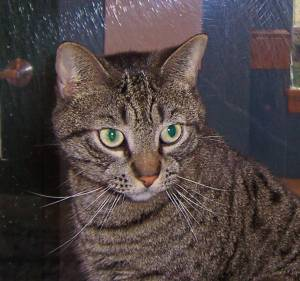

In [43]:
np.array(img1) #tensorflow needs to be used to change the pixel values to 0-1 rather than 0-256

In [44]:
train_datagen = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1/255.0)
valid_datagen = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1/255.0)

In [45]:
#resize all the images to the same size
train_data = train_datagen.flow_from_directory(
    directory='data/train/',
    target_size=(224, 224),
    class_mode='categorical',
    batch_size=64,
    seed=42
)

Found 20030 images belonging to 2 classes.


In [46]:
first_batch = train_data.next()

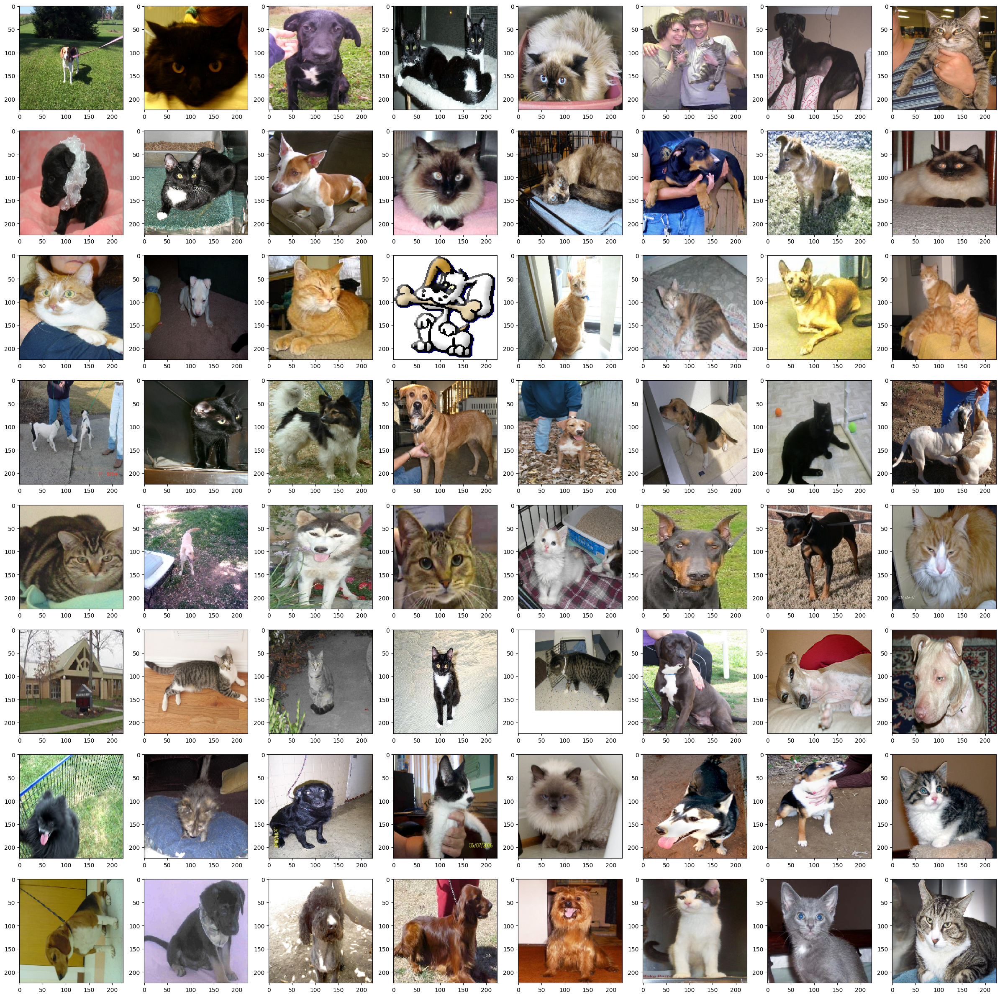

In [47]:
def visualize_batch(batch: tf.keras.preprocessing.image.DirectoryIterator):
    n = 64
    num_row, num_col = 8, 8
    fig, axes = plt.subplots(num_row, num_col, figsize=(3 * num_col, 3 * num_row))

    for i in range(n):
        img = np.array(batch[0][i] * 255, dtype='uint8')
        ax = axes[i // num_col, i % num_col]
        ax.imshow(img)

    plt.tight_layout()
    plt.show()


visualize_batch(batch=first_batch)

In [48]:
train_data = train_datagen.flow_from_directory(
    directory='data/train/',
    target_size=(224, 224),
    class_mode='categorical',
    batch_size=64,
    seed=42
)

valid_data = valid_datagen.flow_from_directory(
    directory='data/validation/',
    target_size=(224, 224),
    class_mode='categorical',
    batch_size=64,
    seed=42
)

Found 20030 images belonging to 2 classes.
Found 2478 images belonging to 2 classes.


**Model with 16 filters**

In [50]:
model_1 = tf.keras.Sequential([
    tf.keras.layers.Conv2D(filters=16, kernel_size=(3, 3), input_shape=(224, 224, 3), activation='relu'),
    tf.keras.layers.MaxPool2D(pool_size=(2, 2), padding='same'),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dense(2, activation='softmax')
])

model_1.compile(
    loss=tf.keras.losses.categorical_crossentropy,
    optimizer=tf.keras.optimizers.Adam(),
    metrics=[tf.keras.metrics.BinaryAccuracy(name='accuracy')]
)

history_1 = model_1.fit(
    train_data,
    validation_data=valid_data,
    epochs=10
)

313/313 [==============================] - 734s 2s/step - loss: 1.0639 - accuracy: 0.6206 - val_loss: 0.6013 - val_accuracy: 0.6667


**Model with 32 filters and 2 convolutional and pooling layers.**

In [ ]:
model_3 = tf.keras.Sequential([
    tf.keras.layers.Conv2D(filters=32, kernel_size=(3, 3), input_shape=(224, 224, 3), activation='relu'),
    tf.keras.layers.MaxPool2D(pool_size=(2, 2), padding='same'),
    tf.keras.layers.Conv2D(filters=32, kernel_size=(3, 3), activation='relu'),
    tf.keras.layers.MaxPool2D(pool_size=(2, 2), padding='same'),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dense(2, activation='softmax')
])

model_3.compile(
    loss=tf.keras.losses.categorical_crossentropy,
    optimizer=tf.keras.optimizers.Adam(),
    metrics=[tf.keras.metrics.BinaryAccuracy(name='accuracy')]
)

history_3 = model_3.fit(
    train_data,
    validation_data=valid_data,
    epochs=10
)

In [51]:
def prepare_single_image(img_path: str) -> np.array:
    img = Image.open(img_path)
    img = img.resize(size=(224, 224))
    return np.array(img) / 255.0

In [65]:
single_image = prepare_single_image(img_path='data/test/dog/10172.jpg')
single_prediction = model_1.predict(single_image.reshape(-1, 224, 224, 3))
single_prediction



1/1 [==============================] - 0s 166ms/step


array([[0.09268714, 0.9073128 ]], dtype=float32)

(499, 422, 3)


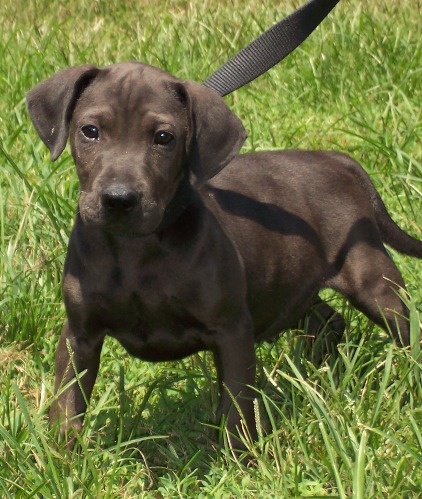

In [66]:
img1 = Image.open('data/test/dog/10172.jpg') #verify size of image, the CNN requires all iamges to be the same size
print(np.array(img1).shape)
display(img1)

In [56]:
num_total_cat, num_correct_cat = 0, 0
num_total_dog, num_correct_dog = 0, 0

for img_path in pathlib.Path.cwd().joinpath('data/test/cat').iterdir():
    try:
        img = prepare_single_image(img_path=str(img_path))
        pred = model_1.predict(tf.expand_dims(img, axis=0))
        pred = pred.argmax()
        num_total_cat += 1
        if pred == 0:
            num_correct_cat += 1
    except Exception as e:
        continue

for img_path in pathlib.Path.cwd().joinpath('data/test/dog').iterdir():
    try:
        img = prepare_single_image(img_path=str(img_path))
        pred = model_1.predict(tf.expand_dims(img, axis=0))
        pred = pred.argmax()
        num_total_dog += 1
        if pred == 1:
            num_correct_dog += 1
    except Exception as e:
        continue

1/1 [==============================] - 0s 39ms/step


KeyboardInterrupt: 

#steps

- split the zipped foled into train test val for assignment
- Validating images and removing corrupted
- fixing the pixels to convert to 0-1
- resize the images
- build the CNN model
- modify model
- validate metrics against the test data (should be done at the end to ensure the model has not seen the data before)